In [ ]:
!pip3 install yt_dlp

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 21.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 66.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.4/194.4 kB 46.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 80.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 157.3/157.3 kB 23.7 MB/s eta 0:00:00
  Attempting uninstall: requests
    Found existing installation: requests 2.31.0
    Uninstalling requests-2.31.0:
      Successfully uninstalled requests-2.31.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests==2.31.0, but you have requests 2.32.3 which is incompatible.


**DOWNLOAD VIDEO**

In [ ]:
import yt_dlp as youtube_dl

# URL do vídeo do YouTube
#video_url = 'https://www.youtube.com/watch?v=MaV_z7dRBAU'
video_url = 'https://www.youtube.com/watch?v=bNUvHgXPYfo'
# Opções para download
ydl_opts = {
    'outtmpl': '/content/work_src/EDSR/downloaded_video.%(ext)s',  # Substitua pelo caminho desejado
    'format': 'bestvideo[ext=mp4]',
    'merge_output_format': 'mp4',  # Escolher resolução máxima de 1080p
}

# Função para baixar o vídeo
with youtube_dl.YoutubeDL(ydl_opts) as ydl:
    ydl.download([video_url])

print('Vídeo baixado com sucesso!')

[youtube] Extracting URL: https://www.youtube.com/watch?v=bNUvHgXPYfo
[youtube] bNUvHgXPYfo: Downloading webpage
[youtube] bNUvHgXPYfo: Downloading ios player API JSON
[youtube] bNUvHgXPYfo: Downloading web creator player API JSON
[youtube] bNUvHgXPYfo: Downloading m3u8 information
[info] bNUvHgXPYfo: Downloading 1 format(s): 625
[download] /content/work_src/EDSR/downloaded_video.mp4 has already been downloaded
[download] 100% of  980.20MiB
Vídeo baixado com sucesso!


**SAVE FRAMESS**

In [ ]:
import cv2
import os
import sys

def save_frames_from_video(video_path, hr_folder, lr_folder, num_frames):
    # Verificar se as pastas de destino existem, se não, criá-las
    os.makedirs(hr_folder, exist_ok=True)
    os.makedirs(lr_folder, exist_ok=True)

    # Carregar o vídeo
    video = cv2.VideoCapture(video_path)
    total_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calcular o intervalo de frames a serem capturados
    frame_interval = total_frames // num_frames
    print(frame_interval)
    frame_count = 0
    saved_frames = 0

    while saved_frames < num_frames and video.isOpened():
        ret, frame = video.read()

        if not ret:
            break

        # Verificar se o frame atual deve ser salvo
        if frame_count % frame_interval == 0:
            print(saved_frames)
            # Redimensionar para metade da resolução (HR)
            hr_frame = cv2.resize(frame, (frame.shape[1] // 2, frame.shape[0] // 2))
            # Redimensionar para 1/8 da resolução (LR)
            lr_frame = cv2.resize(frame, (frame.shape[1] // 8, frame.shape[0] // 8))

            # Salvar os frames
            cv2.imwrite(os.path.join(hr_folder, f'frame_{saved_frames:04d}_hr.jpg'), hr_frame)
            cv2.imwrite(os.path.join(lr_folder, f'frame_{saved_frames:04d}_lr.jpg'), lr_frame)

            saved_frames += 1

        frame_count += 1

    video.release()
    print(f'{saved_frames} frames salvos em {hr_folder} e {lr_folder}')

# Caminho para o vídeo MP4
video_path = '/content/work_src/EDSR/downloaded_video.mp4'

# Pastas de destino para salvar as imagens HR e LR
hr_folder = '/work_src/EDSR/hr'
lr_folder = '/work_src/EDSR/lr'

# Salvar 1000 frames igualmente espaçados
save_frames_from_video(video_path, hr_folder, lr_folder, num_frames=300)


62
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276

**GENERALIZACAO**

In [ ]:
def flip_left_right(lowres_img, highres_img):
    """Flips Images to left and right."""

    # Outputs random values from a uniform distribution in between 0 to 1
    rn = tf.random.uniform(shape=(), maxval=1)
    # If rn is less than 0.5 it returns original lowres_img and highres_img
    # If rn is greater than 0.5 it returns flipped image
    return tf.cond(
        rn < 0.5,
        lambda: (lowres_img, highres_img),
        lambda: (
            tf.image.flip_left_right(lowres_img),
            tf.image.flip_left_right(highres_img),
        ),
    )


def random_rotate(lowres_img, highres_img):
    """Rotates Images by 90 degrees."""

    # Outputs random values from uniform distribution in between 0 to 4
    rn = tf.random.uniform(shape=(), maxval=4, dtype=tf.int32)
    # Here rn signifies number of times the image(s) are rotated by 90 degrees
    return tf.image.rot90(lowres_img, rn), tf.image.rot90(highres_img, rn)


def random_crop(lowres_img, highres_img, hr_crop_size=128, scale=4):
    """Crop images.

    low resolution images: 24x24
    high resolution images: 96x96
    """
    lowres_crop_size = hr_crop_size // scale  # 96//4=24
    lowres_img_shape = tf.shape(lowres_img)[:2]  # (height,width)

    lowres_width = tf.random.uniform(
        shape=(), maxval=lowres_img_shape[1] - lowres_crop_size + 1, dtype=tf.int32
    )
    lowres_height = tf.random.uniform(
        shape=(), maxval=lowres_img_shape[0] - lowres_crop_size + 1, dtype=tf.int32
    )

    highres_width = lowres_width * scale
    highres_height = lowres_height * scale

    lowres_img_cropped = lowres_img[
        lowres_height : lowres_height + lowres_crop_size,
        lowres_width : lowres_width + lowres_crop_size,
    ]  # 24x24
    highres_img_cropped = highres_img[
        highres_height : highres_height + hr_crop_size,
        highres_width : highres_width + hr_crop_size,
    ]  # 96x96

    return lowres_img_cropped, highres_img_cropped


In [ ]:
tf.config.experimental.set_memory_growth

<function tensorflow.python.framework.config.set_memory_growth(device, enable)>

**DATASET**

In [ ]:
import os
from PIL import Image
import numpy as np
import tensorflow as tf

hr_folder = '/work_src/EDSR/hr'
lr_folder = '/work_src/EDSR/lr'

def load_images_from_folder(folder):
  images = []
  for filename in sorted(os.listdir(folder)):
    #print(filename)
    img = Image.open(os.path.join(folder,filename))
    if img is not None:
      images.append(np.array(img))
  return images

hr_images = load_images_from_folder(hr_folder)
lr_images = load_images_from_folder(lr_folder)



In [ ]:
print(type(hr_images))
print(len(hr_images))
print(type(hr_images[0]))
print(lr_images[0].shape)

<class 'list'>
300
<class 'numpy.ndarray'>
(270, 480, 3)


In [ ]:
train = tf.data.Dataset.from_tensor_slices((lr_images, hr_images))
print('pass')
val = tf.data.Dataset.from_tensor_slices((lr_images, hr_images)) # You might want to split the data for validation
print('pass')
train_cache = train.cache()
print('pass')
val_cache = val.cache()
print('final pass')

pass
pass
pass
final pass


In [ ]:
# Obter um exemplo do dataset
example = next(iter(train))

# Separar as imagens de baixa e alta resolução
lr_image, hr_image = example

# Exibir os shapes das imagens
print(f'Shape da imagem de baixa resolução: {lr_image.shape}')
print(f'Shape da imagem de alta resolução: {hr_image.shape}')


Shape da imagem de baixa resolução: (270, 480, 3)
Shape da imagem de alta resolução: (1080, 1920, 3)


In [ ]:
AUTOTUNE = tf.data.AUTOTUNE
def dataset_object(dataset_cache, training=True):

    ds = dataset_cache
    ds = ds.map(
        lambda lowres, highres: random_crop(lowres, highres, scale=4),
        num_parallel_calls=AUTOTUNE,
    )

    if training:
        ds = ds.map(random_rotate, num_parallel_calls=AUTOTUNE)
        ds = ds.map(flip_left_right, num_parallel_calls=AUTOTUNE)
    # Batching Data
    ds = ds.batch(16)

    if training:
        # Repeating Data, so that cardinality if dataset becomes infinte
        ds = ds.repeat()
    # prefetching allows later images to be prepared while the current image is being processed
    ds = ds.prefetch(buffer_size=AUTOTUNE)
    return ds


train_ds = dataset_object(train_cache, training=True)
val_ds = dataset_object(val_cache, training=False)

**ALTERNATIVE PLOT**

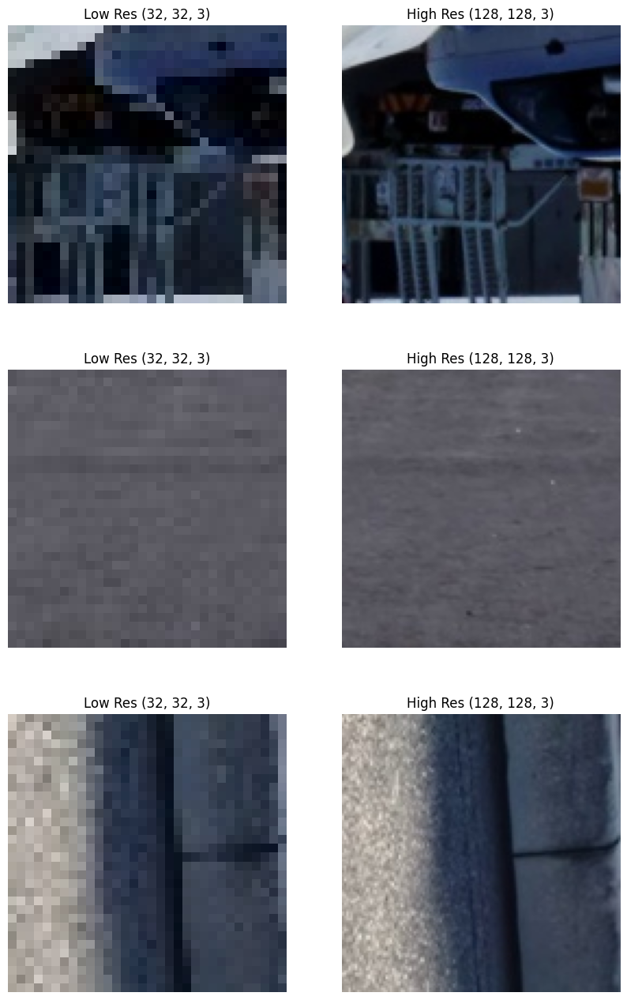

In [ ]:
import matplotlib.pyplot as plt
import random
lowres, highres = next(iter(train_ds))

# Exibir as imagens lado a lado
plt.figure(figsize=(10, 50))
for i in range(3):
    ii = i + 10
    # Imagem de baixa resolução
    ax = plt.subplot(9, 2, 2 * i + 1)  # Subplot para a imagem de baixa resolução
    plt.imshow(lowres[ii].numpy().astype("uint8"))
    plt.title(f"Low Res {lowres[i].shape}")
    plt.axis("off")

    # Imagem de alta resolução
    ax = plt.subplot(9, 2, 2 * i + 2)  # Subplot para a imagem de alta resolução
    plt.imshow(highres[ii].numpy().astype("uint8"))
    plt.title(f"High Res {highres[i].shape}")
    plt.axis("off")

plt.show()


In [ ]:
tf.distribute.MirroredStrategy()

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)


**MONTAR MODELO**

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers

# Peak Signal-to-Noise Ratio (PSNR), que é uma métrica utilizada para medir a
# qualidade das imagens reconstruídas. PSNR é uma medida comum em super-resolução
# para avaliar quão próxima a imagem gerada (super-resolução) está da imagem de
# referência (alta resolução).

def PSNR(super_resolution, high_resolution):
    """Calcula o pico de razão sinal-ruído, medindo a qualidade da imagem."""
    # Valor máximo de um pixel é 255
    psnr_value = tf.image.psnr(high_resolution, super_resolution, max_val=255)[0]
    return psnr_value

class EDSRModel(tf.keras.Model):
    def train_step(self, data):
        x, y = data

        with tf.GradientTape() as tape:
            y_pred = self(x, training=True)  # Forward pass
            # Compute the loss value
            # (the loss function is configured in `compile()`)
            loss = self.compiled_loss(y, y_pred, regularization_losses=self.losses)

        # Compute gradients
        trainable_vars = self.trainable_variables
        gradients = tape.gradient(loss, trainable_vars)
        # Update weights
        self.optimizer.apply_gradients(zip(gradients, trainable_vars))
        self.compiled_metrics.update_state(y, y_pred)
        return {m.name: m.result() for m in self.metrics}

    def predict_step(self, x):
        # Adding dummy dimension using tf.expand_dims and converting to float32 using tf.cast
        x = tf.cast(tf.expand_dims(x, axis=0), tf.float32)
        super_resolution_img = self(x, training=False)
        super_resolution_img = tf.clip_by_value(super_resolution_img, 0, 255)
        super_resolution_img = tf.round(super_resolution_img)

        super_resolution_img = tf.squeeze(tf.cast(super_resolution_img, tf.uint8), axis=0)
        return super_resolution_img

# Residual Block
def ResBlock(inputs):
    x = layers.Conv2D(64, 3, padding="same", activation="relu")(inputs)
    x = layers.Conv2D(64, 3, padding="same")(x)
    x = layers.Add()([inputs, x])
    return x

def Upsampling(inputs, factor=2, **kwargs):
    x = layers.Conv2D(64 * (factor ** 2), 3, padding="same", **kwargs)(inputs)
    x = layers.Lambda(lambda x: tf.nn.depth_to_space(x, block_size=factor))(x)
    x = layers.Conv2D(64 * (factor ** 2), 3, padding="same", **kwargs)(x)
    x = layers.Lambda(lambda x: tf.nn.depth_to_space(x, block_size=factor))(x)
    return x

def make_model(num_filters, num_of_residual_blocks):
    # Flexible Inputs to input_layer
    input_layer = layers.Input(shape=(None, None, 3))
    # Scaling Pixel Values
    x = layers.Rescaling(scale=1.0 / 255)(input_layer)
    x = x_new = layers.Conv2D(num_filters, 3, padding="same")(x)

    # 16 residual blocks
    for _ in range(num_of_residual_blocks):
        x_new = ResBlock(x_new)

    x_new = layers.Conv2D(num_filters, 3, padding="same")(x_new)
    x = layers.Add()([x, x_new])
    x = Upsampling(x)
    x = layers.Conv2D(3, 3, padding="same")(x)

    output_layer = layers.Rescaling(scale=255)(x)
    return EDSRModel(input_layer, output_layer)

model = make_model(num_filters=64, num_of_residual_blocks=16)

**TREINO**

In [ ]:
# Using adam optimizer with initial learning rate as 1e-4, changing learning rate after 5000 steps to 5e-5
optim_edsr = keras.optimizers.Adam(
    learning_rate=keras.optimizers.schedules.PiecewiseConstantDecay(
        boundaries=[5000], values=[1e-4, 5e-5]
    )
)
# Compiling model with loss as mean absolute error(L1 Loss) and metric as psnr
model.compile(optimizer=optim_edsr, loss="mae", metrics=[PSNR])
# Training for more epochs will improve results
model.fit(train_ds, epochs=200, steps_per_epoch=200, validation_data=val_ds)

Epoch 1/200
200/200 [==============================] - 18s 48ms/step - loss: 7.8528 - PSNR: 30.3760 - val_loss: 5.5428 - val_PSNR: 31.8310
Epoch 2/200
200/200 [==============================] - 9s 47ms/step - loss: 5.6396 - PSNR: 31.8479 - val_loss: 5.5317 - val_PSNR: 34.9710
Epoch 3/200
200/200 [==============================] - 10s 48ms/step - loss: 5.2652 - PSNR: 33.3672 - val_loss: 5.4021 - val_PSNR: 34.0872
Epoch 4/200
200/200 [==============================] - 10s 48ms/step - loss: 4.8744 - PSNR: 34.3478 - val_loss: 5.4920 - val_PSNR: 31.9168
Epoch 5/200
200/200 [==============================] - 10s 49ms/step - loss: 4.7148 - PSNR: 34.3651 - val_loss: 4.7739 - val_PSNR: 33.6328
Epoch 6/200
200/200 [==============================] - 10s 48ms/step - loss: 4.6053 - PSNR: 34.9567 - val_loss: 4.8593 - val_PSNR: 34.5863
Epoch 7/200
200/200 [==============================] - 10s 48ms/step - loss: 4.4895 - PSNR: 34.6183 - val_loss: 4.4340 - val_PSNR: 32.5150
Epoch 8/200
200/200 [=======

**PLOT RESULTS**

In [ ]:
def central_crop(image, crop_size):
    image_shape = tf.shape(image)
    image_height, image_width = image_shape[0], image_shape[1]

    crop_height, crop_width = crop_size

    #Center image
    center_y, center_x = image_height // 2, image_width // 2

    #Coordinates for cropping
    y1 = tf.maximum(center_y - crop_height // 2, 0)
    x1 = tf.maximum(center_x - crop_width // 2, 0)
    y2 = tf.minimum(center_y + crop_height // 2, image_height)
    x2 = tf.minimum(center_x + crop_width // 2, image_width)

    cropped_image = image[y1:y2, x1:x2]

    return cropped_image

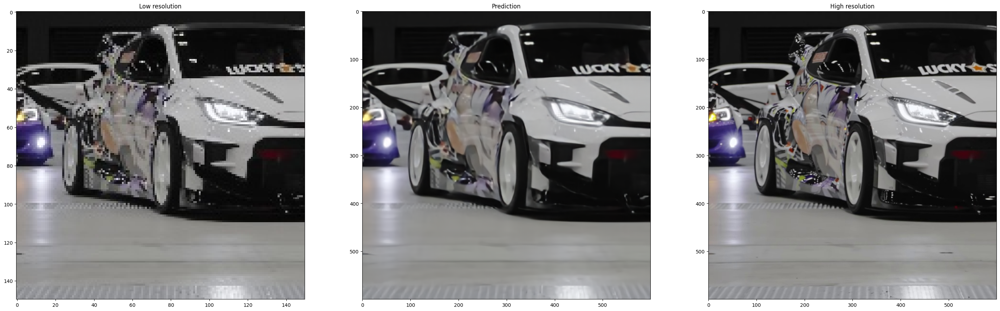

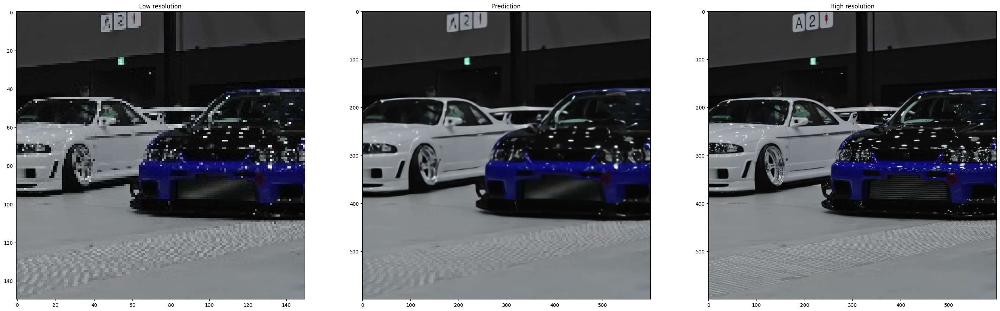

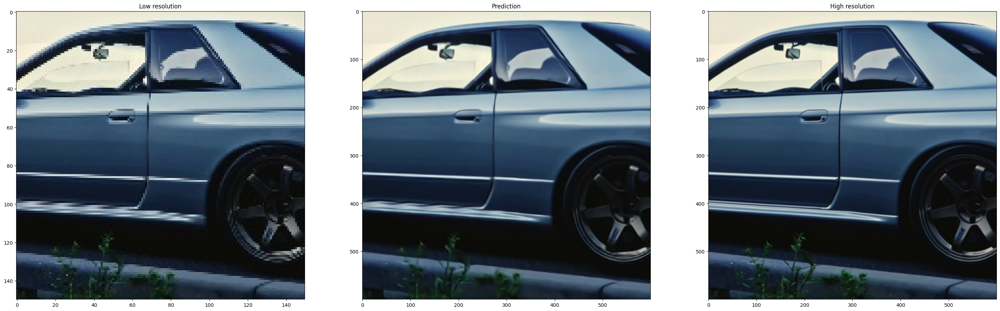

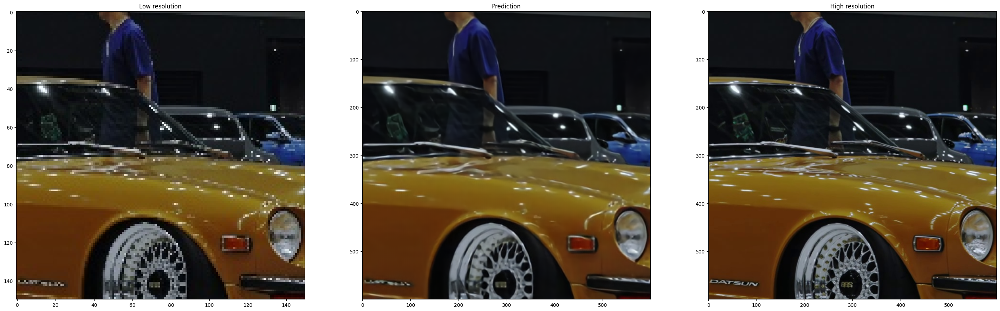

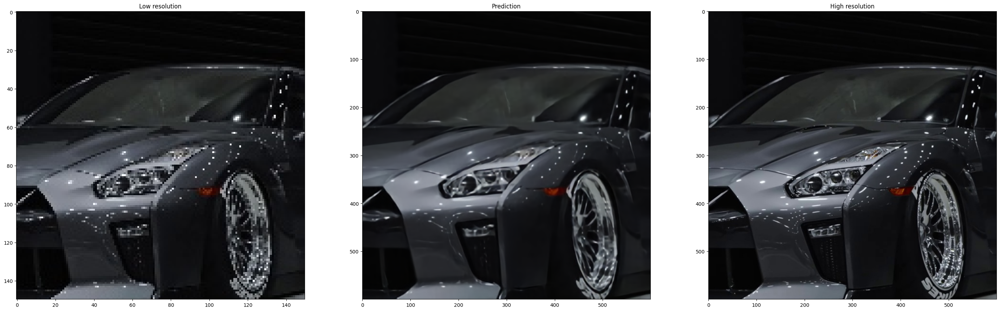

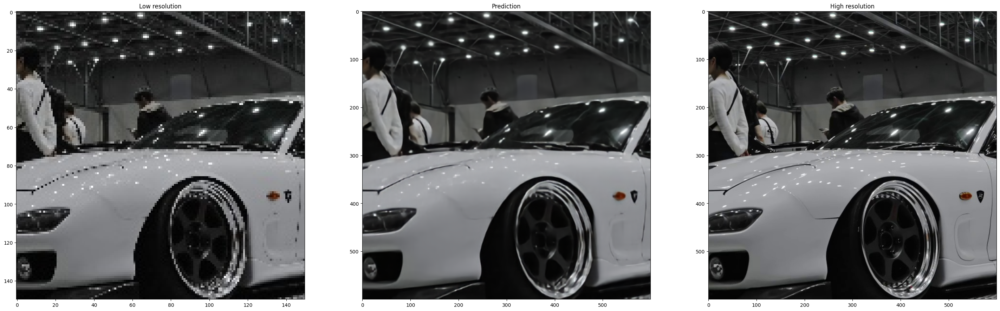

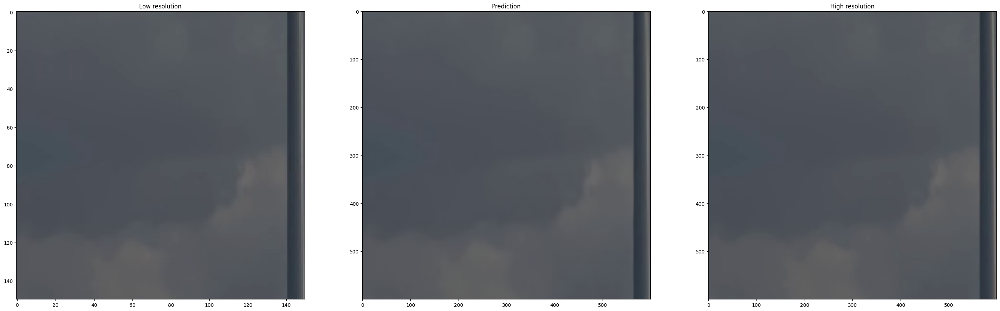

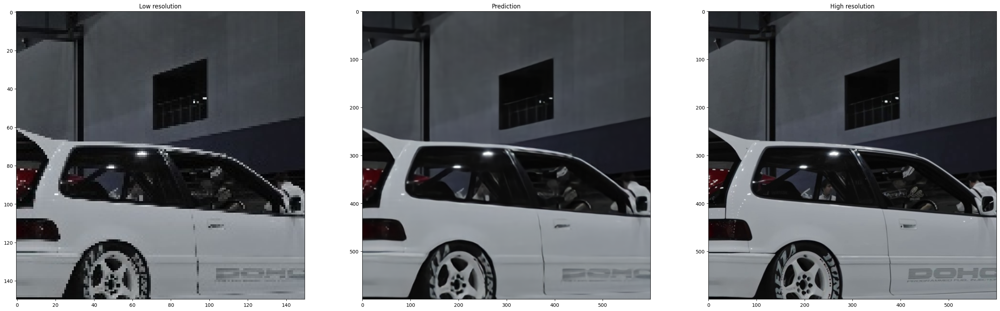

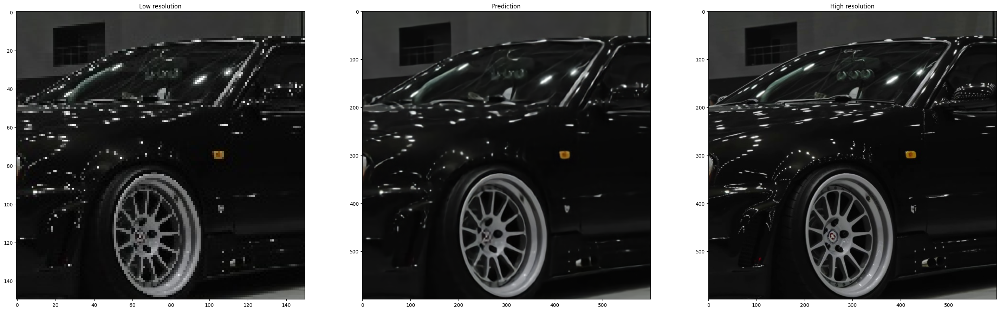

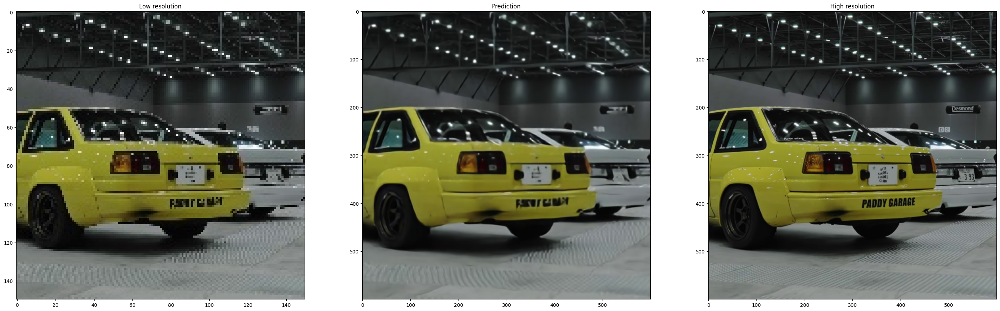

In [ ]:
def plot_results(lowres, preds, highres):

    plt.figure(figsize=(36, 21))
    plt.subplot(131), plt.imshow(lowres), plt.title("Low resolution")
    plt.subplot(132), plt.imshow(preds), plt.title("Prediction")
    plt.subplot(133), plt.imshow(highres), plt.title("High resolution")
    plt.show()

shuffled_ds = val.shuffle(buffer_size=10000)
random_samples = shuffled_ds.take(10)

for lowres, highres in random_samples:
    lowres = central_crop(lowres, (150, 150))
    highres = central_crop(highres, (600, 600))
    preds = model.predict_step(lowres)
    plot_results(lowres, preds, highres)

**SALVAR PESOS**

In [ ]:
model.save_weights('/workspace/EDSR/second_upscaling_.weights.h5')

In [ ]:
#!pip3 install numba
from numba import cuda
device = cuda.get_current_device()
device.reset()

In [ ]:
# prompt: faça o codigo que carregue o modelo salvo e apliquem em imagem jpg que esta na maquina e a salve com resolução 4 vezes maior e com o edsr aplicado para aumentar a qualidade e a salve com o nome de upscaling_{nome_oriignal}.jpg

import cv2
import numpy as np
import tensorflow as tf
from PIL import Image
from tensorflow.keras import layers
import os

class EDSRModel(tf.keras.Model):
    def train_step(self, data):
        x, y = data

        with tf.GradientTape() as tape:
            y_pred = self(x, training=True)  # Forward pass
            # Compute the loss value
            # (the loss function is configured in `compile()`)
            loss = self.compiled_loss(y, y_pred, regularization_losses=self.losses)

        # Compute gradients
        trainable_vars = self.trainable_variables
        gradients = tape.gradient(loss, trainable_vars)
        # Update weights
        self.optimizer.apply_gradients(zip(gradients, trainable_vars))
        self.compiled_metrics.update_state(y, y_pred)
        return {m.name: m.result() for m in self.metrics}

    def predict_step(self, x):
        # Adding dummy dimension using tf.expand_dims and converting to float32 using tf.cast
        x = tf.cast(tf.expand_dims(x, axis=0), tf.float32)
        super_resolution_img = self(x, training=False)
        super_resolution_img = tf.clip_by_value(super_resolution_img, 0, 255)
        super_resolution_img = tf.round(super_resolution_img)

        super_resolution_img = tf.squeeze(tf.cast(super_resolution_img, tf.uint8), axis=0)
        return super_resolution_img

def ResBlock(inputs):
    x = layers.Conv2D(64, 3, padding="same", activation="relu")(inputs)
    x = layers.Conv2D(64, 3, padding="same")(x)
    x = layers.Add()([inputs, x])
    return x

def Upsampling(inputs, factor=2, **kwargs):
    x = layers.Conv2D(64 * (factor ** 2), 3, padding="same", **kwargs)(inputs)
    x = layers.Lambda(lambda x: tf.nn.depth_to_space(x, block_size=factor))(x)
    x = layers.Conv2D(64 * (factor ** 2), 3, padding="same", **kwargs)(x)
    x = layers.Lambda(lambda x: tf.nn.depth_to_space(x, block_size=factor))(x)
    return x

def make_model(num_filters, num_of_residual_blocks):
    # Flexible Inputs to input_layer
    input_layer = layers.Input(shape=(None, None, 3))
    # Scaling Pixel Values
    x = layers.Rescaling(scale=1.0 / 255)(input_layer)
    x = x_new = layers.Conv2D(num_filters, 3, padding="same")(x)

    # 16 residual blocks
    for _ in range(num_of_residual_blocks):
        x_new = ResBlock(x_new)

    x_new = layers.Conv2D(num_filters, 3, padding="same")(x_new)
    x = layers.Add()([x, x_new])
    x = Upsampling(x)
    x = layers.Conv2D(3, 3, padding="same")(x)

    output_layer = layers.Rescaling(scale=255)(x)
    return EDSRModel(input_layer, output_layer)

# Carregar o modelo salvo
model = make_model(num_filters=64, num_of_residual_blocks=16)
model.load_weights('/workspace/EDSR/second_upscaling_.weights.h5')

# Caminho para a imagem de entrada
image_path = '/content/work_src/EDSR/mf.png'  # Substitua pelo caminho da sua imagem

# Carregar a imagem
img = Image.open(image_path).convert('RGB')
img_array = np.array(img)

# Redimensionar a imagem para a resolução desejada
lowres_img = cv2.resize(img_array, (img_array.shape[1], img_array.shape[0]))

# Aplicar o modelo EDSR
preds = model.predict_step(lowres_img)

# Salvar a imagem com a resolução 4 vezes maior e com o EDSR aplicado
filename = os.path.basename(image_path)
name, ext = os.path.splitext(filename)
output_path = f'/content/work_src/EDSR/upscaling_{name}{ext}'
cv2.imwrite(output_path, preds.numpy())

print(f'Imagem salva em {output_path}')
